# Пространственная фильтрация

### Обязательные библиотеки

In [1]:
from __future__ import annotations
from funcy import rcompose
from abc import ABC, abstractmethod
from typing import List, Tuple, Any, Optional, Callable, TypeVar, Type
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from skimage import io, color, filters, feature, exposure, morphology
from scipy.ndimage.filters import laplace, gaussian_laplace

### Общий код

In [2]:
T = TypeVar('T', bound='ImageMatrix')

class ImageMatrix(ABC):
    _image: Optional[np.ndarray]
        
    def __init__(self, array: Optional[np.ndarray] = None, link: Optional[str] = None) -> None:
        self._image = array

        if link:
            self._load_image(link)

    def __repr__(self) -> str:
        return np.array_repr(self._image)
    
    def __add__(self, other: Type[T]) -> T:
        return type(self)(self._image + other.image)
    
    def __sub__(self, other: Type[T]) -> T:
        return type(self)(self._image - other.image)
    
    def __mul__(self, other: Type[T]) -> T:
        return type(self)(self._image * other.image)

    @property
    def image(self) -> np.ndarray:
        return self._image

    @abstractmethod
    def _load_image(self, link: str) -> None:
        pass

    @abstractmethod
    def show_image(self) -> None:
        pass
    
    def norm(self) -> T:
        minimum: Union[int, float] = self._image.min() 
        maximum: Union[int, float] = self._image.max()
        new_image: np.ndarray = np.vectorize(
            lambda x: (x - minimum) * 255 / (maximum - minimum)
        )(self._image).astype(int)
        return type(self)(new_image)
        
    def apply_filter(self, applied_filter: Callable[..., np.ndarray], *args: Any, **kwargs: Any) -> T:
        return type(self)(applied_filter(self._image, *args, **kwargs))


class GrayImageMatrix(ImageMatrix):
    def _load_image(self, link: str) -> None:
        factor: int = 256
        if '.tif' in link:
            factor = 1
        self._image = rcompose(
            io.imread,
            color.rgb2gray,
            lambda x: np.floor(x * factor),
            lambda x: x.astype(int)
        )(link)

    def show_image(self, ax: Any = None, default_size: Optional[int] = None) -> None:
        v_range: Tuple[int, int] = (
            self._image.min(),
            self._image.max()
        )
        if default_size:
            plt.figure(figsize=(default_size, default_size))
        if not ax:
            plt.imshow(self._image, cmap='gray', vmin=v_range[0], vmax=v_range[1])
        else:
            ax.imshow(self._image, cmap='gray', vmin=v_range[0], vmax=v_range[1])
        

class ImageGrid:
    @staticmethod
    def show(images: List[T], dim: Tuple[int, int], default_size: int = 10) -> None:
        ax: Any = plt.subplots(nrows=dim[0], ncols=dim[1], figsize=(default_size * dim[0], default_size * dim[1]))[1]
        for index, image in enumerate(images):
            if dim[0] == 1:
                image.show_image(ax[index % dim[1]])
            else:
                image.show_image(ax[index // dim[1], index % dim[1]])
                
    @staticmethod
    def map_difference(image: Type[T]) -> None:
        plt.figure(figsize=(20,20))
        sns.heatmap(image.image, cmap='RdYlGn', square=True)

### Задание №1

Процедура, много лет использующаяся в полиграфии и в издательском деле для повышения резкости изображений, заключается в вычитании из изображения его нерезкой (сглаженной) копии. Эта процедура, называемая нерезким маскированием, состоит из следующих шагов.
1. Создание нерезкого изображения (сглаженный сигнал из исходного).
2. Вычитание нерезкого изображения из исходного изображения (результирующая разность называется нерезкая маска).
3. Прибавление маски к исходному изображению (получаем сигнал с повышенной резкостью).

Заметим, что отрицательные значения также прибавляются к исходному сигналу. Тем самым в результате суммирования могут появиться отрицательные значения, если на исходном изображении были близкие к нулю значения или если значение коэффициента k выбрано излишне большим, в результате чего пики маски могут выйти за допустимый диапазон яркостей. Отрицательные значения могут вызвать появление темного ореола вокруг контуров, что при достаточно большом k может привести к нежелательному результату.

In [3]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3cashmere.png')
modified_image: GrayImageMatrix = source_image.apply_filter(
    filters.rank.mean, 
    selem=morphology.square(5)
)
difference_image: GrayImageMatrix = source_image - modified_image
summarized_image: GrayImageMatrix = source_image + difference_image

/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:131: UserWarning: Possible sign loss when converting negative image of type int64 to positive image of type uint8.
  .format(dtypeobj_in, dtypeobj_out))
/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:184: UserWarning: Downcasting int64 to uint8 without scaling because max value 253 fits in uint8
  "value {} fits in {}".format(a.dtype, dtype, a.max(), dtype))


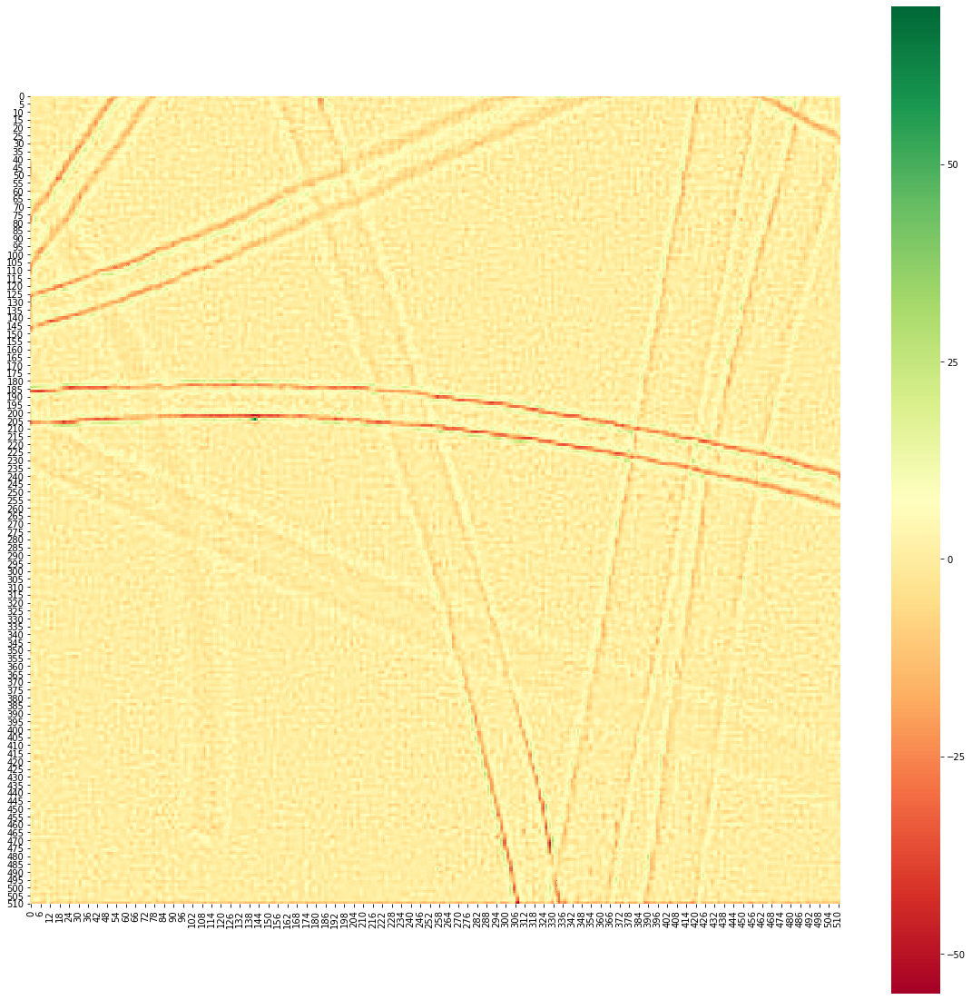

In [4]:
ImageGrid.map_difference(difference_image)

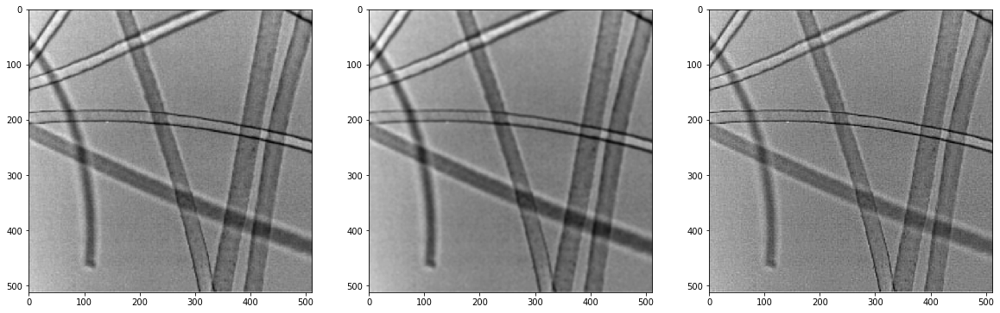

In [5]:
ImageGrid.show([
    source_image,
    modified_image,
    summarized_image
], dim=(1, 3), default_size=20)

### Задание №2

In [6]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3ct-image.png')
mean_filter_3_image: GrayImageMatrix = source_image.apply_filter(
    filters.rank.mean, 
    selem=morphology.square(3)
)
mean_filter_5_image: GrayImageMatrix = source_image.apply_filter(
    filters.rank.mean, 
    selem=morphology.square(5)
)
gaussian_filter_2_3_image: GrayImageMatrix = source_image.apply_filter(
    filters.gaussian, 
    sigma=2 / 3,
    preserve_range=True
)
gaussian_filter_2_image: GrayImageMatrix = source_image.apply_filter(
    filters.gaussian, 
    sigma=2,
    preserve_range=True
)
gaussian_filter_4_image: GrayImageMatrix = source_image.apply_filter(
    filters.gaussian, 
    sigma=4,
    preserve_range=True
)

/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:184: UserWarning: Downcasting int64 to uint8 without scaling because max value 251 fits in uint8
  "value {} fits in {}".format(a.dtype, dtype, a.max(), dtype))


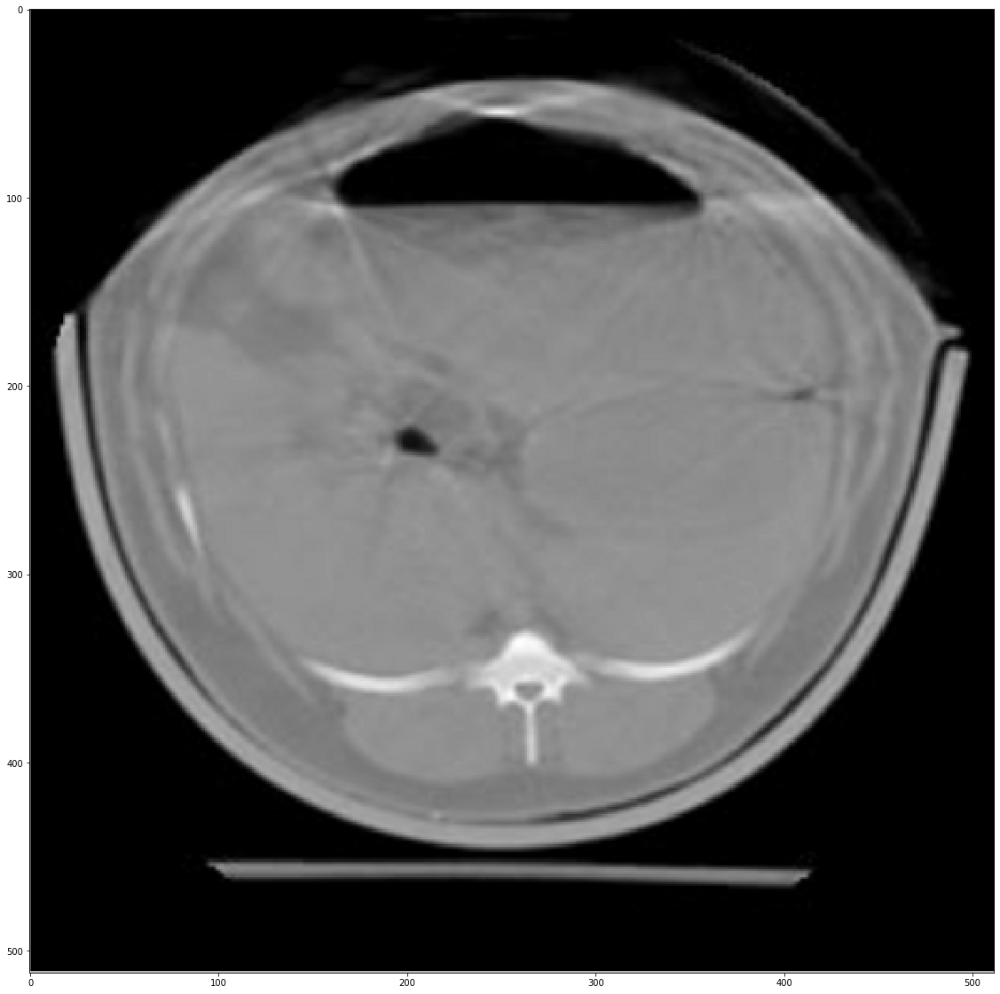

In [7]:
source_image.show_image(default_size=20)

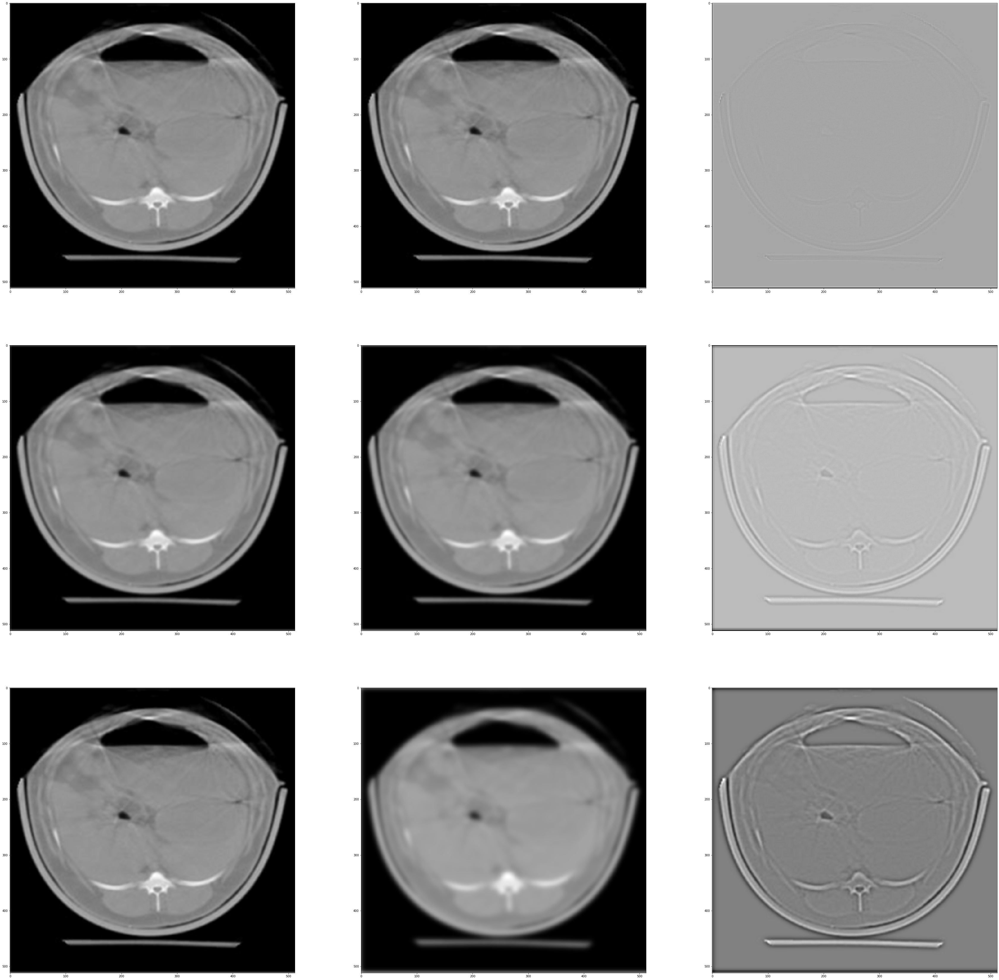

In [8]:
ImageGrid.show([
    mean_filter_3_image,
    gaussian_filter_2_3_image,
    mean_filter_3_image - gaussian_filter_2_3_image,
    mean_filter_5_image,
    gaussian_filter_2_image,
    mean_filter_5_image - gaussian_filter_2_image,
    mean_filter_3_image,
    gaussian_filter_4_image,
    mean_filter_3_image - gaussian_filter_4_image
], dim=(3, 3), default_size=20)

### Задание №3

Наилучшие результаты поиска контуров объектов на изображении дает метод Канни. В итоге алгоритм выделения контуров Кэнни состоит из следующих основных шагов:
1. Сгладить исходное изображение гауссовым фильтром.
2. Сформировать изображения модуля и направления градиента.
3. Применить подавление немаксимальных точек к изображению модуля градиента.
4. Выполнить преобразование с двойным порогом и анализ связности для обнаружения и связывания контуров.

In [9]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3wheel.png')
sobel_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.sobel
)
prewitt_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.prewitt
)
canny_filter_image: GrayImageMatrix = source_image.apply_filter(
    feature.canny,
    low_threshold=0,
    high_threshold=1,
    use_quantiles=True
)

/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:135: UserWarning: Possible precision loss when converting from int64 to float64
  .format(dtypeobj_in, dtypeobj_out))


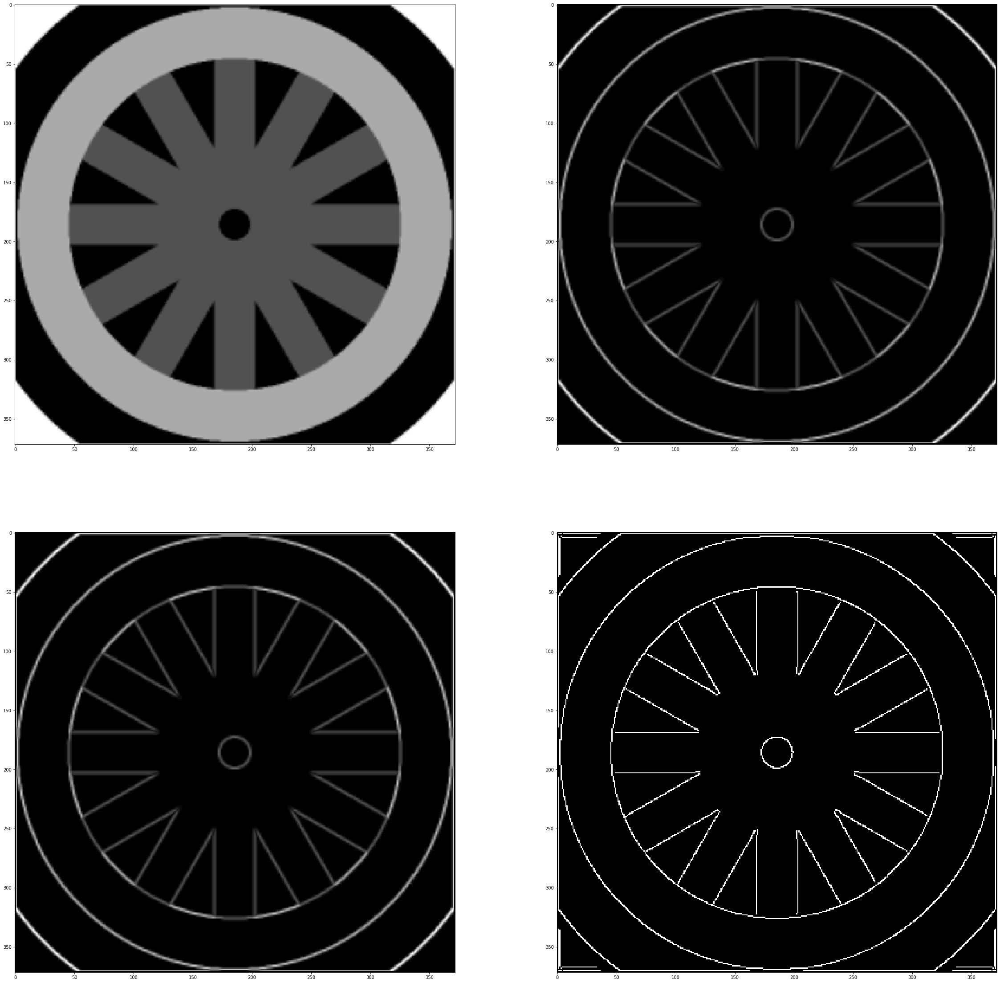

In [10]:
ImageGrid.show([
    source_image,
    sobel_filter_image,
    prewitt_filter_image,
    canny_filter_image
], dim=(2, 2), default_size=20)

In [11]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3bikes.png')
sobel_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.sobel
)
prewitt_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.prewitt
)
canny_filter_image: GrayImageMatrix = source_image.apply_filter(
    feature.canny,
    low_threshold=0,
    high_threshold=1,
    use_quantiles=True
)
canny_filter_3_image: GrayImageMatrix = source_image.apply_filter(
    feature.canny,
    sigma=3,
    low_threshold=0,
    high_threshold=1,
    use_quantiles=True
)
canny_filter_5_image: GrayImageMatrix = source_image.apply_filter(
    feature.canny,
    sigma=3,
    low_threshold=0,
    high_threshold=1,
    use_quantiles=True
)

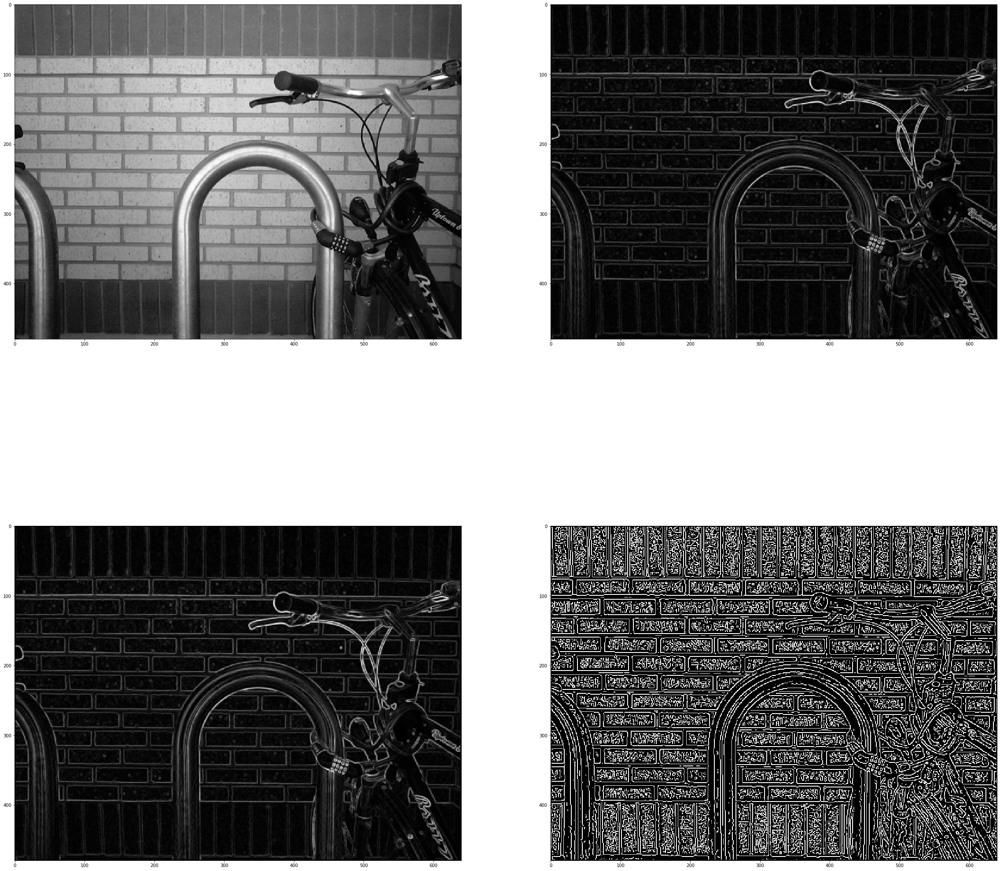

In [12]:
ImageGrid.show([
    source_image,
    sobel_filter_image,
    prewitt_filter_image,
    canny_filter_image,
], dim=(2, 2), default_size=20)

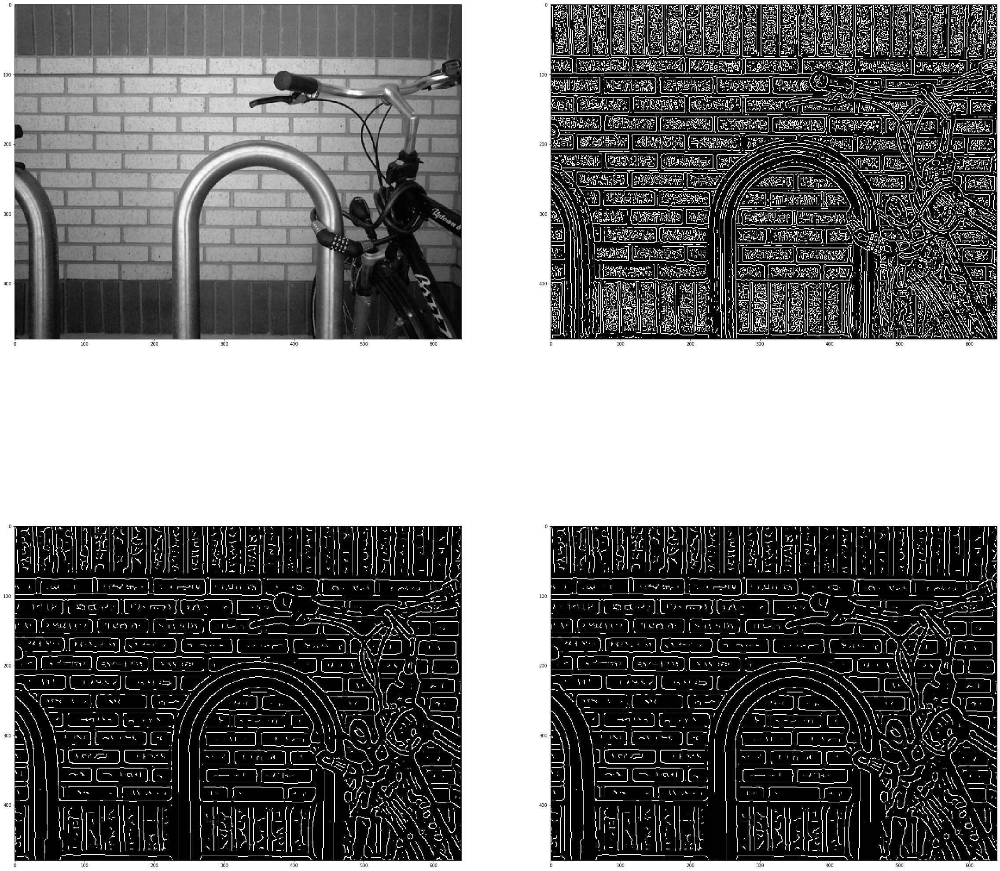

In [13]:
ImageGrid.show([
    source_image,
    canny_filter_image,
    canny_filter_3_image,
    canny_filter_5_image
], dim=(2, 2), default_size=20)

### Задание №4

In [14]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3moon.tif')
laplace_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.laplace
).norm()

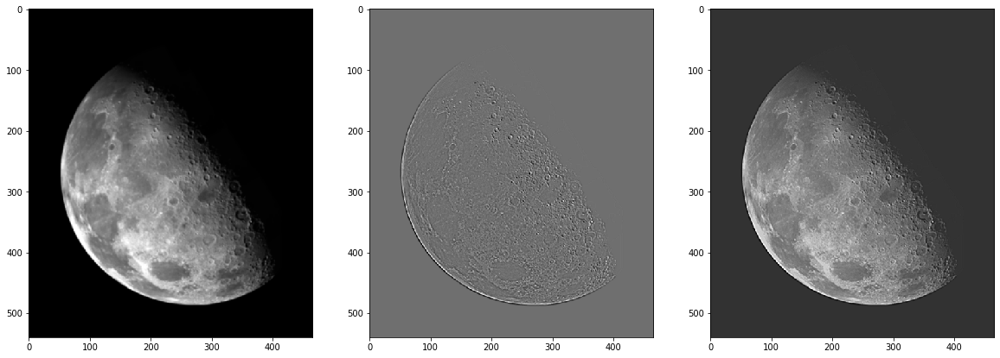

In [15]:
ImageGrid.show([
    source_image,
    laplace_filter_image,
    source_image + laplace_filter_image
], dim=(1, 3), default_size=20)

In [16]:
modified_image: GrayImageMatrix = source_image.apply_filter(
    filters.rank.mean, 
    selem=morphology.square(3)
)
difference_image: GrayImageMatrix = source_image - modified_image
summarized_image: GrayImageMatrix = source_image + difference_image

/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:184: UserWarning: Downcasting int64 to uint8 without scaling because max value 254 fits in uint8
  "value {} fits in {}".format(a.dtype, dtype, a.max(), dtype))


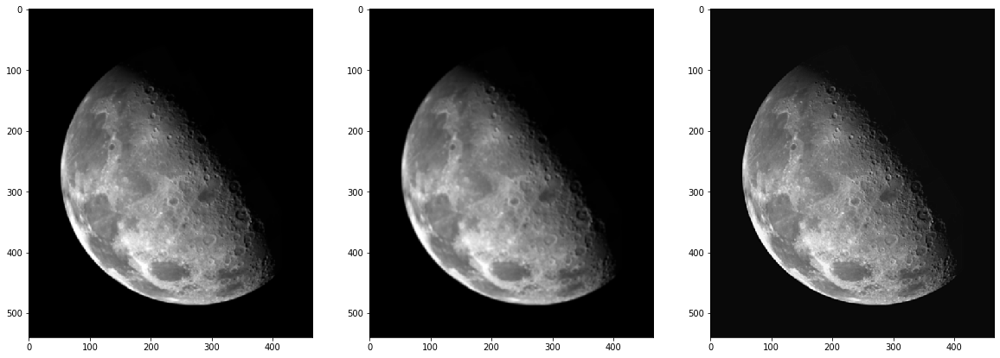

In [17]:
ImageGrid.show([
    source_image,
    modified_image,
    summarized_image
], dim=(1, 3), default_size=20)

### Задание №5

In [18]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3skeleton.tif')
laplace_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.laplace
).norm()
sobel_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.sobel
).norm()

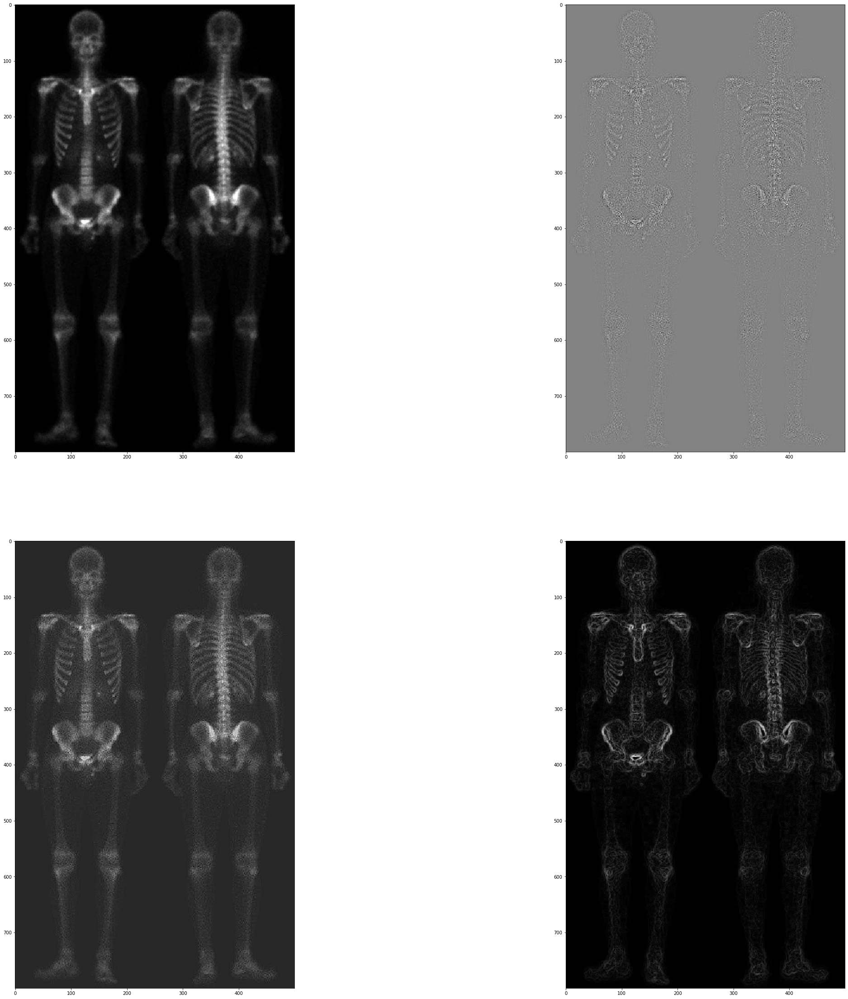

In [19]:
ImageGrid.show([
    source_image,
    laplace_filter_image,
    source_image + laplace_filter_image,
    sobel_filter_image
], dim=(2, 2), default_size=20)

In [20]:
mean_filter_image: GrayImageMatrix = sobel_filter_image.apply_filter(
    filters.rank.mean, 
    selem=morphology.square(5)
)
modified_image: GrayImageMatrix = (mean_filter_image * (source_image + laplace_filter_image)).norm()   
gamma_filter_image: GrayImageMatrix = (source_image + modified_image).apply_filter(
    exposure.adjust_gamma,
    gamma=1 / 2.5
)

/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:184: UserWarning: Downcasting int64 to uint8 without scaling because max value 255 fits in uint8
  "value {} fits in {}".format(a.dtype, dtype, a.max(), dtype))


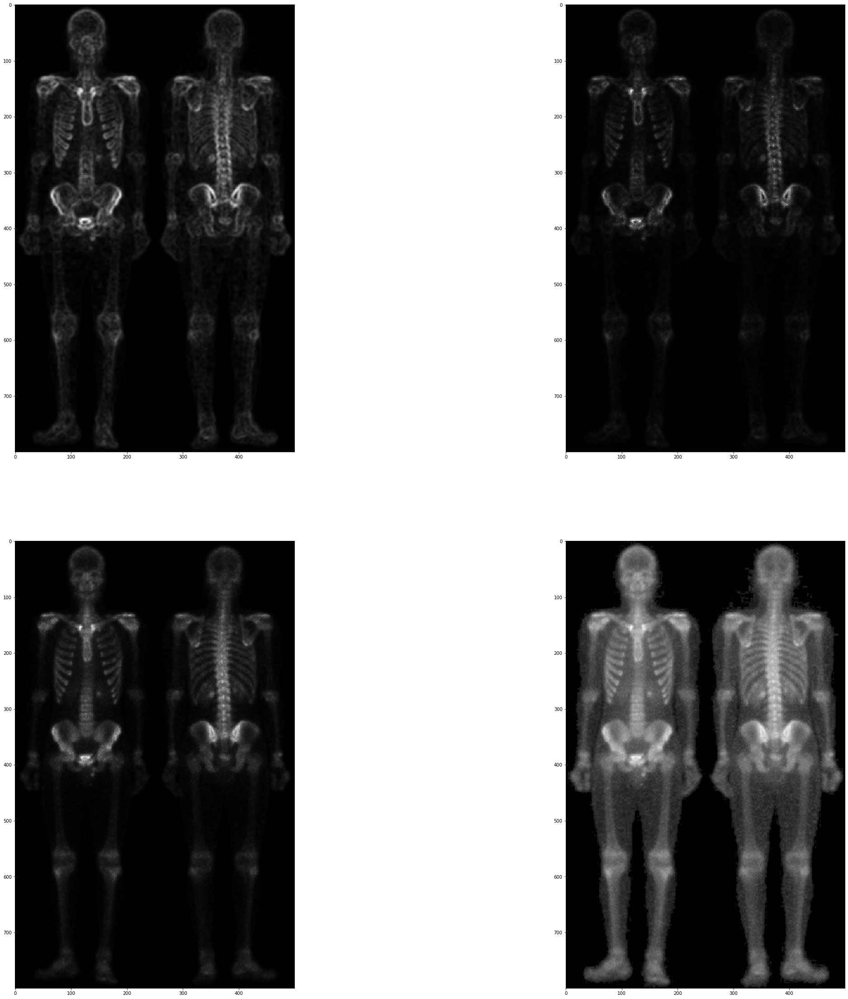

In [21]:
ImageGrid.show([
    mean_filter_image,
    modified_image,
    source_image + modified_image,
    gamma_filter_image
], dim=(2, 2), default_size=20)

### Задание №6

In [22]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3sudoku.jpg')
median_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.median, 
    selem=morphology.square(20)
)

/home/happy-unicorn/anaconda3/lib/python3.7/site-packages/skimage/util/dtype.py:184: UserWarning: Downcasting int64 to uint8 without scaling because max value 206 fits in uint8
  "value {} fits in {}".format(a.dtype, dtype, a.max(), dtype))


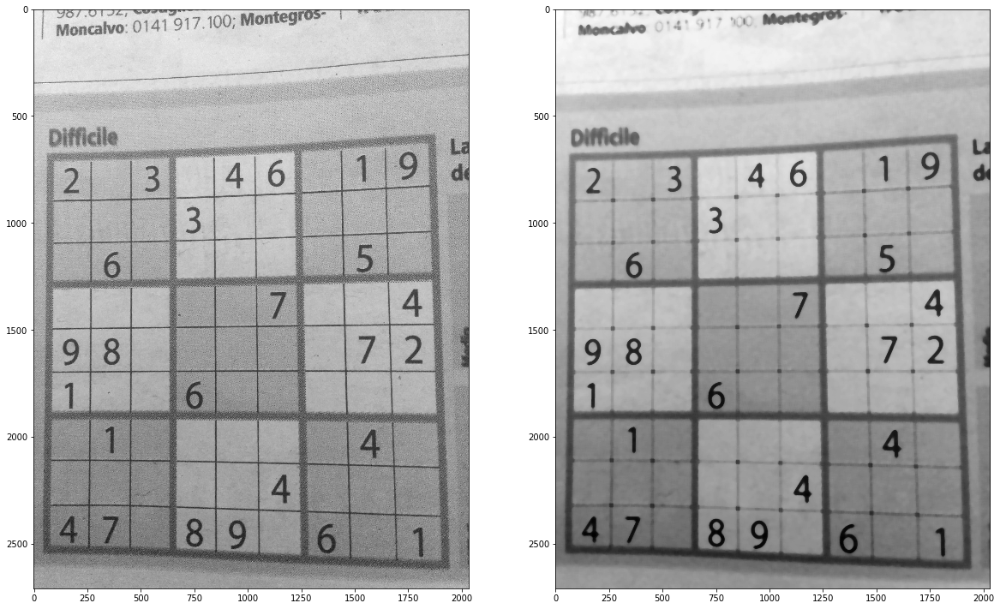

In [23]:
ImageGrid.show([
    source_image,
    median_filter_image
], dim=(1, 2), default_size=20)

In [24]:
sobel_filter_image: GrayImageMatrix = median_filter_image.apply_filter(
    filters.sobel
)
prewitt_filter_image: GrayImageMatrix = median_filter_image.apply_filter(
    filters.prewitt
)
laplace_filter_image: GrayImageMatrix = median_filter_image.apply_filter(
    filters.laplace
).norm()
gaussian_laplace_filter_image: GrayImageMatrix = source_image.apply_filter(
    gaussian_laplace,
    sigma=2.5
).norm()
canny_filter_image: GrayImageMatrix = source_image.apply_filter(
    feature.canny,
    sigma=15,
    low_threshold=0,
    high_threshold=1,
    use_quantiles=True
)

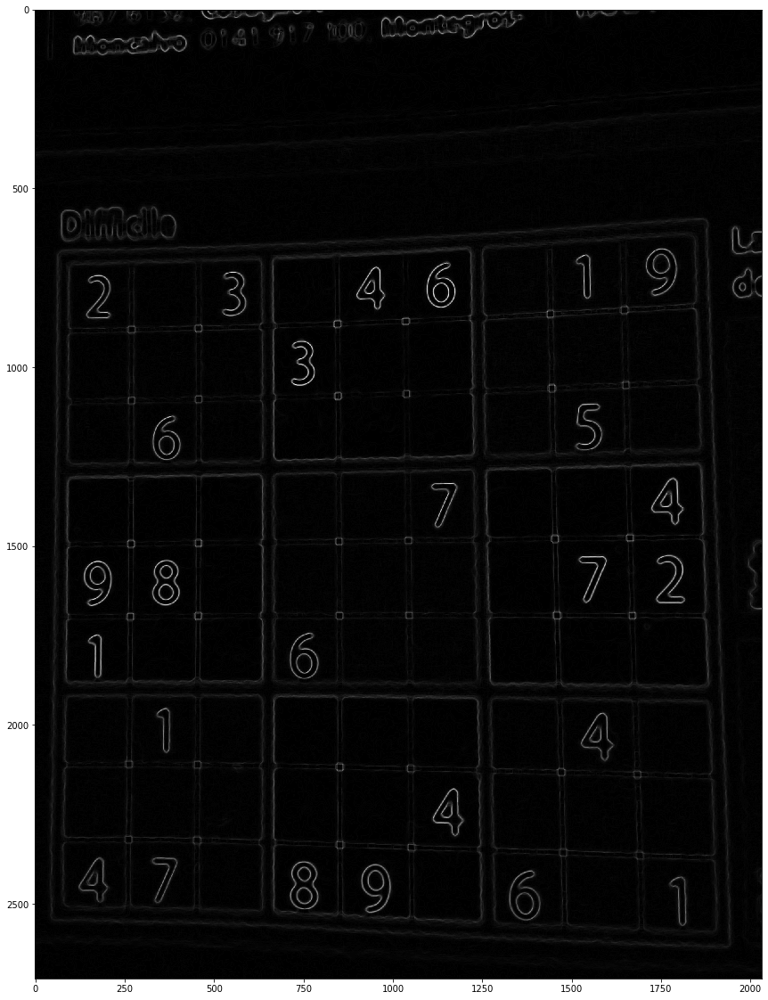

In [25]:
sobel_filter_image.show_image(default_size=20)

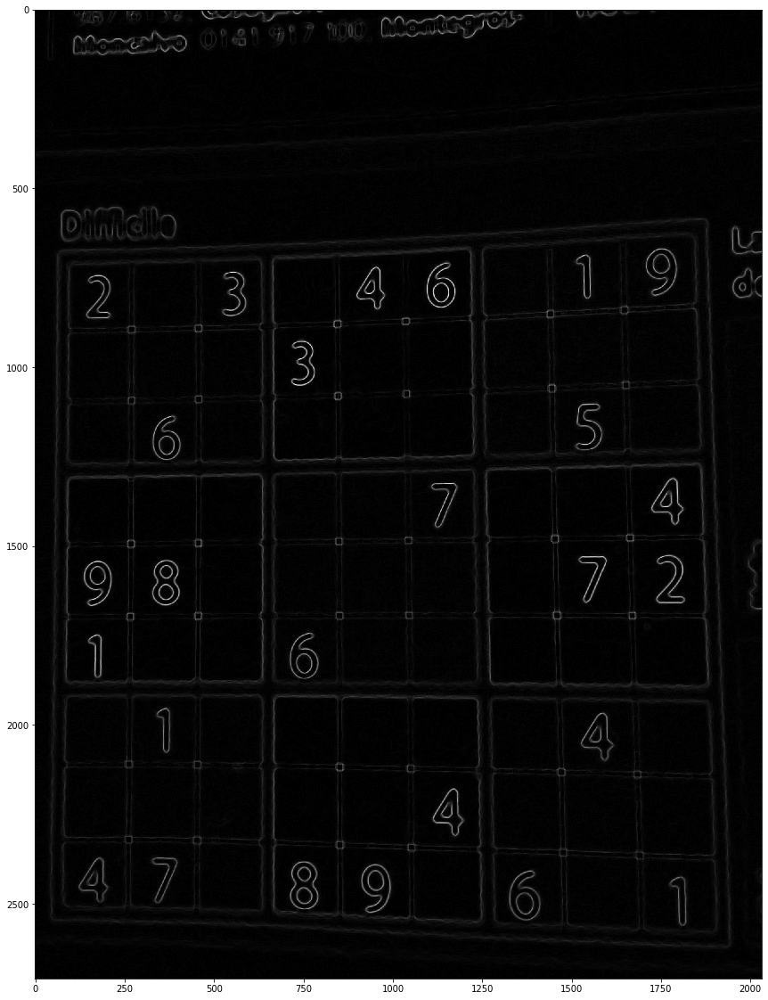

In [26]:
prewitt_filter_image.show_image(default_size=20)

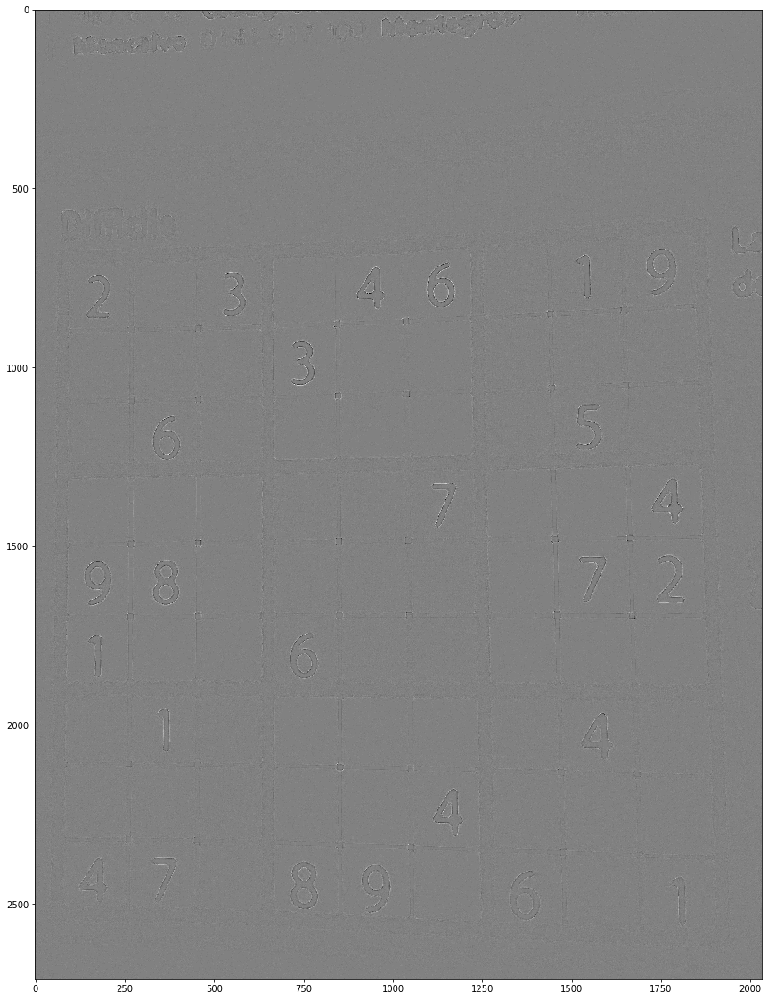

In [27]:
laplace_filter_image.show_image(default_size=20)

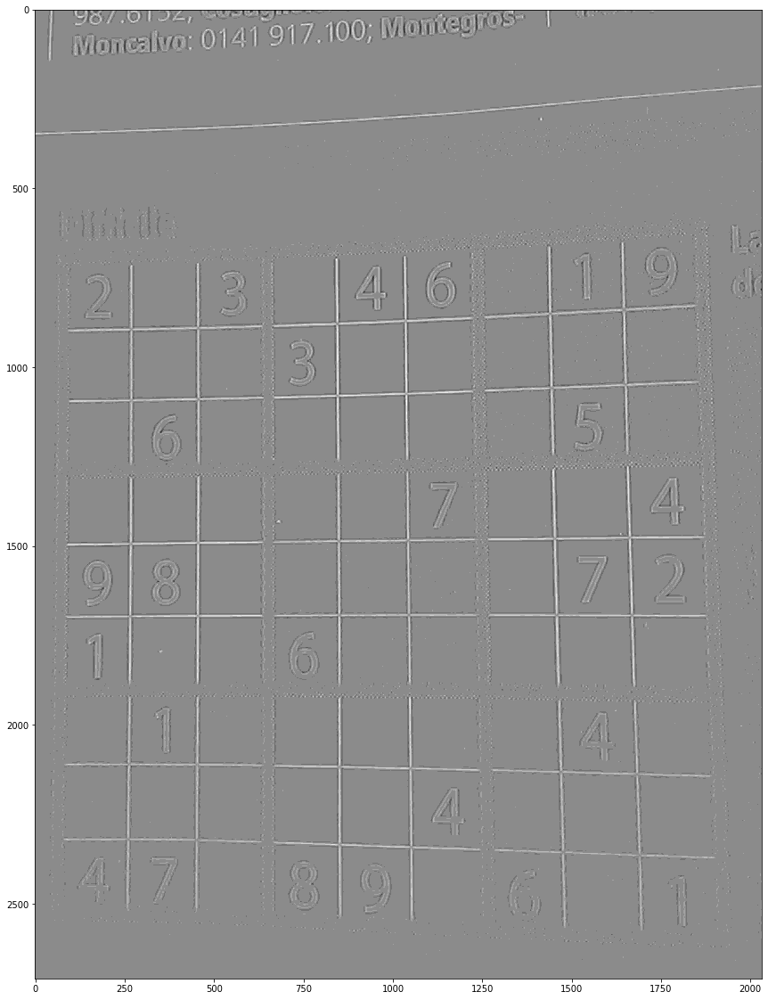

In [28]:
gaussian_laplace_filter_image.show_image(default_size=20)

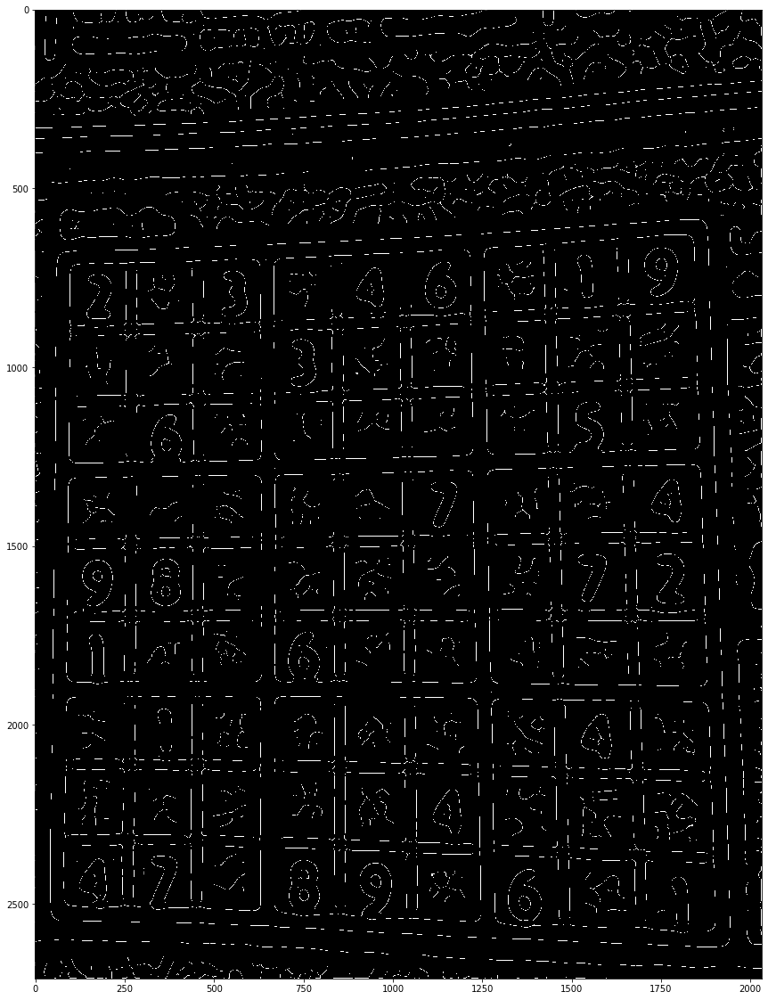

In [29]:
canny_filter_image.show_image(default_size=20)

### Задание №7

In [30]:
source_image: GrayImageMatrix = GrayImageMatrix(link='pictures/3circuit.tif')
median_filter_image: GrayImageMatrix = source_image.apply_filter(
    filters.median,
    selem=morphology.square(3)
)

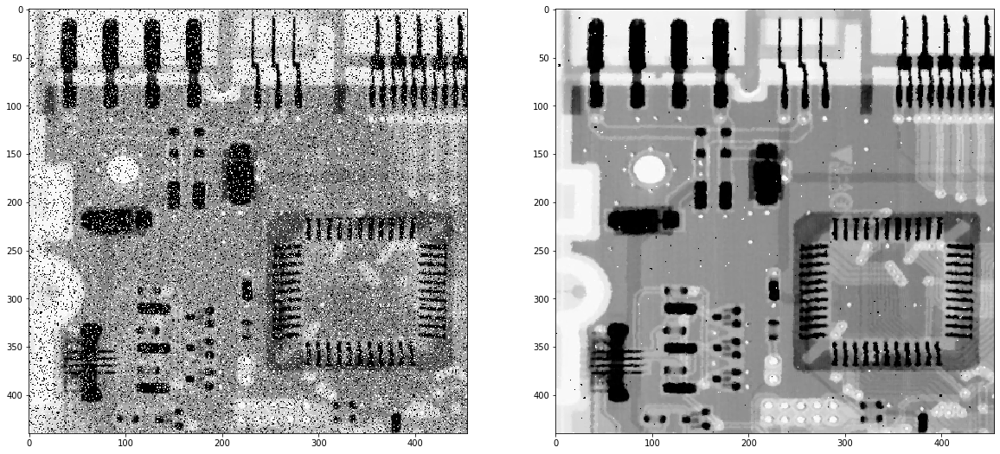

In [31]:
ImageGrid.show([
    source_image,
    median_filter_image,
], dim=(1, 2), default_size=20)